In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns
import matplotlib
matplotlib.rcParams['font.family'] ='Malgun Gothic'
matplotlib.rcParams['axes.unicode_minus'] =False
from tqdm import tqdm

In [2]:
energy = pd.read_csv('C:/Users/user/github/Data/energy/train.csv', encoding='cp949')
solar = pd.read_csv('C:\\Users\\user\\github\\Data\\capstone\\weather/solar_power_2204.csv')


In [3]:
solar['datetime'] = pd.to_datetime(solar['datetime'])
solar.target.replace(65535.0, solar.target.mean(), inplace=True)
solar['month'] = solar.datetime.dt.month
solar['hour'] = solar.datetime.dt.hour
solar['year'] = solar.datetime.dt.year
solar['day'] = solar.datetime.dt.day

solar_eda = solar.groupby(['year','month','day','hour']).mean().reset_index()
solar_eda[['year','month','day','hour']] = solar_eda[['year','month','day','hour']].astype('str')
solar_eda['date'] = (solar_eda.year + '-' + solar_eda.month + '-' + solar_eda.day + ' ' + solar_eda.hour + ':00')
solar_eda.date = pd.to_datetime(solar_eda.date)

In [4]:
solar_eda = solar_eda.set_index('date')
solar_eda = solar_eda.fillna(0)

In [5]:
ee = solar.groupby(['hour']).mean().target
ee[:7] = 0
ee[20:] = 0
ee = ee * 2.5

In [6]:
winter_max = [9, 10, 11, 16, 17, 18]
winter_mid = [8, 12, 13, 14, 15, 19, 20, 21]
winter_min = [0, 1, 2, 3, 4, 5, 6, 7, 22, 23]

spring_max = [11, 13, 14, 15, 16, 17]
spring_mid = [9, 10, 12, 18, 19, 20, 21]
spring_min = [0, 1, 2, 3, 4, 5, 6, 7, 22, 23]

In [7]:
df = pd.read_csv('C:/Users/user/github/Data/energy/train.csv', encoding='cp949')
df.date_time = pd.to_datetime(df.date_time)

In [8]:
eda_df = df.copy()

eda_df['month'] = 0
eda_df['hour'] = 0
eda_df['year'] = 0
eda_df['day'] = 0
eda_df['요일'] = 0

In [9]:
days = {0: '월요일', 1: '화요일', 2: '수요일', 3: '목요일', 4: '금요일', 5: '토요일', 6: '일요일'}

In [10]:
eda_df['month'] = eda_df.date_time.dt.month
eda_df['hour'] = eda_df.date_time.dt.hour
eda_df['year'] = eda_df.date_time.dt.year
eda_df['day'] = eda_df.date_time.dt.day
eda_df['요일'] = eda_df['date_time'].dt.weekday.map(days)

In [11]:
qq = eda_df[eda_df['태양광보유'] == 0].groupby(['hour']).mean()['전력사용량(kWh)']

In [12]:
summer_price = [84.8, 84.8, 84.8, 84.8, 84.8,
                84.8, 84.8, 84.8, 137.7, 137.7,
                137.7, 219.8, 137.7, 219.8, 219.8,
                219.8, 219.8, 219.8, 137.7, 137.7,
                137.7, 137.7, 84.8, 84.8]

normal_price = [84.8, 84.8, 84.8, 84.8, 84.8,
                84.8, 84.8, 84.8, 107.3, 107.3,
                107.3, 138, 107.3, 138, 138,
                138, 138, 138, 107.3, 107.3,
                107.3, 107.3, 84.8, 84.8]

winter_price = [91.8, 91.8, 91.8, 91.8, 91.8, 
                91.8, 91.8, 91.8, 137.9, 195.4,
                195.4, 195.4, 137.9, 137.9, 137.9,
                137.9, 195.4, 195.4, 195.4, 137.9,
                137.9, 137.9, 91.8, 91.8]

winter_max = [9, 10, 11, 16, 17, 18]
winter_mid = [8, 12, 13, 14, 15, 19, 20, 21]
winter_min = [0, 1, 2, 3, 4, 5, 6, 7, 22, 23]

other_max = [11, 13, 14, 15, 16, 17]
other_mid = [8, 9, 10, 12, 18, 19, 20, 21]
other_min = [0, 1, 2, 3, 4, 5, 6, 7, 22, 23]

price_dict = {"winter": winter_price, "spring": normal_price, "summer": summer_price, "fall": normal_price}

time_dict = {"winter_max": winter_max, "winter_mid": winter_mid, "winter_min": winter_min,
             "spring_max": other_max, "spring_mid": other_mid, "spring_min": other_min}


In [13]:
import pyswarms as ps
from math import *
import random
import sys

In [14]:
class Particle:
    def __init__(self, max_iter, initial_position=None):
        if initial_position:  # If an initial position is provided
            self.position = initial_position.copy()
        else:
            self.position = [0.0]*24  # particle current position
        self.velocity = [random.uniform(-1, 1) for _ in range(24)]  # particle current velocity
        self.best_position = [0.0]*24  # particle best position
        self.fitness = sys.maxsize   # particle fitness
        self.best_fitness = sys.maxsize  # particle best fitness
        self.iteration = 0  # iteration count
        self.max_iter = max_iter

    def evaluate_fitness(self, fitness_func):
        self.fitness = fitness_func(self.position)
        if self.fitness < self.best_fitness:
            self.best_position = self.position.copy()
            self.best_fitness = self.fitness

    def update_velocity(self, global_best_position):
        w_min = 0.5
        w_max = 1
        self.iteration += 1
        w = w_max - ((w_max - w_min) * self.iteration / self.max_iter)
        c1 = 1
        c2 = 1.5
        for i in range(len(self.position)):
            r1 = random.random()
            r2 = random.random()
            cognitive_velocity = c1 * r1 * (self.best_position[i] - self.position[i])
            social_velocity = c2 * r2 * (global_best_position[i] - self.position[i])
            self.velocity[i] = w * self.velocity[i] + cognitive_velocity + social_velocity

    def update_position(self, bounds):
        for i in range(len(self.position)):
            self.position[i] += self.velocity[i]
            if self.position[i] < bounds[i][0]:
                self.position[i] = bounds[i][0]
            elif self.position[i] > bounds[i][1]:
                self.position[i] = bounds[i][1]

class PSO:
    def __init__(self, fitness_function, bounds, num_particles, max_iter, initial_positions=None):
        self.fitness_func = fitness_function
        self.bounds = bounds
        self.num_particles = num_particles
        self.max_iter = max_iter
        self.global_best_position = [0.0]*24
        self.global_best_fitness = sys.maxsize
        if initial_positions:
            self.swarm = [Particle(max_iter, initial_position=pos) for pos in initial_positions]
        else:
            self.swarm = [Particle(max_iter) for _ in range(num_particles)]

    def run_result(self):
        for i in range(self.max_iter):
            for j in range(self.num_particles):
                self.swarm[j].evaluate_fitness(self.fitness_func)
                if self.swarm[j].fitness < self.global_best_fitness:
                    self.global_best_position = self.swarm[j].position.copy()
                    self.global_best_fitness = self.swarm[j].fitness
            for j in range(self.num_particles):
                self.swarm[j].update_velocity(self.global_best_position)
                self.swarm[j].update_position(self.bounds)
        return self.global_best_position, self.global_best_fitness

def compute_group_mean(data, prices):
    price_groups = {}
    # Group data by prices
    for d, p in zip(data, prices):
        if p not in price_groups:
            price_groups[p] = []
        price_groups[p].append(d)
    # Compute mean for each group
    group_means = {k: np.mean(v) for k, v in price_groups.items()}
    return group_means


def find_peak_group(season_price, power_use):
    # Create a dictionary to map price to hours
    price_to_hours = {}
    for hour, price in enumerate(season_price):
        if price not in price_to_hours:
            price_to_hours[price] = []
        price_to_hours[price].append(hour)
    
    # Identify the group with the highest power use
    max_power = -float('inf')
    peak_group = None
    for price, hours in price_to_hours.items():
        total_power = sum([power_use[hour] for hour in hours])
        if total_power > max_power:
            max_power = total_power
            peak_group = hours

    return peak_group


def fitness_func(position, season, power_generated, power_use):
    total_cost = 0
    cumulative_generated = 0
    cumulative_used = 0
    consumption_pattern = []
    season_price = price_dict[season]
    for i in range(24):
        cumulative_generated += power_generated[i]
        cumulative_used += position[i]
        if cumulative_used > cumulative_generated:  # Cannot use more than generated
            return sys.maxsize
        consumption_pattern.append(power_use[i] - position[i])
        total_cost += (power_use[i] - position[i]) * season_price[i]

        if position[i] > power_use[i] * 0.9 :
            return sys.maxsize
        
    return total_cost

def variance_fitness_func_with_group_mean(position, base_cost, season, power_generated, power_use):
    total_cost = 0
    cumulative_generated = 0
    cumulative_used = 0
    consumption_pattern = []
    season_price = price_dict[season]
    
    for i in range(24):
        cumulative_generated += power_generated[i]
        cumulative_used += position[i]
        
        if cumulative_used > cumulative_generated:
            return sys.maxsize
        
        if position[i] > power_use[i] * 0.9 :
            return sys.maxsize
        
        consumption_pattern.append(power_use[i] - position[i])
        total_cost += (power_use[i] - position[i]) * season_price[i]
    
    if total_cost > base_cost:
        return sys.maxsize
    
    group_means = compute_group_mean(consumption_pattern, season_price)
    peak_group = find_peak_group(season_price, power_use)
    
    weighted_deviation = sum([(consumption_pattern[i] - group_means[season_price[i]])**2 for i in peak_group])

    # peak_weight = 0.8  
    # total_deviation = (peak_weight * weighted_deviation) + (1 - peak_weight) * sum([(consumption_pattern[i] - group_means[season_price[i]])**2 for i in range(24) if i not in peak_group])

    return weighted_deviation

def cal_price_with_variance_optimization_updated(power_generated, power_use, weather):
    bounds = [(0, power_use[i] * 0.8) for i in range(24)]
    initial_positions = [(power_generated*0.5).tolist() if i < 125 else [0]*24 for i in range(250)] 
    pso_price = PSO(lambda x: fitness_func(x, weather, power_generated, power_use), bounds, num_particles = 200, max_iter = 1000, initial_positions=initial_positions)
    best_position_price, best_fitness_price = pso_price.run_result()
    
    initial_positions_variance = [best_position_price for _ in range(200)]
    pso_variance = PSO(lambda x: variance_fitness_func_with_group_mean(x, best_fitness_price, weather, power_generated, power_use), 
                       bounds, num_particles=200, max_iter=1000, initial_positions=initial_positions_variance)
    best_position_variance, _ = pso_variance.run_result()
    
    weather_price = {"winter": winter_price, "spring": normal_price, "summer": summer_price, "fall": normal_price}
    best_fitness_price = np.dot(np.array(power_use) - np.array(best_position_variance), weather_price[weather])
    before_price = np.dot(power_use, weather_price[weather])
    before_optimal_price = np.dot(np.array(power_use) - np.array(power_generated), weather_price[weather])

    return best_position_variance, best_fitness_price, before_optimal_price, before_price




In [15]:
power_generated = ee
power_price = winter_price
power_use = qq

In [16]:
price_dict = {"winter": winter_price, "spring": normal_price, "summer": summer_price, "fall": normal_price}

In [17]:
winter_max = [9, 10, 11, 16, 17, 18]
winter_mid = [8, 12, 13, 14, 15, 19, 20, 21]
winter_min = [0, 1, 2, 3, 4, 5, 6, 7, 22, 23]

other_max = [11, 13, 14, 15, 16, 17]
other_mid = [8, 9, 10, 12, 18, 19, 20, 21]
other_min = [0, 1, 2, 3, 4, 5, 6, 7, 22, 23]

time_dict = {"winter_max": winter_max, "winter_mid": winter_mid, "winter_min": winter_min,
             "spring_max": other_max, "spring_mid": other_mid, "spring_min": other_min}

bounds = [(0, power_use[i]) for i in range(24)]  # bounds based on generated power
pso = PSO(lambda x: fitness_func(x, "summer"), bounds, num_particles=500, max_iter=1000)
best_position, best_fitness = pso.run_result()


In [18]:
class Particle:
    def __init__(self, max_iter, initial_position=None):
        self.position = initial_position if initial_position else [0.0] * 24
        self.velocity = [random.uniform(-1, 1) for _ in range(24)]
        self.best_position = self.position.copy()
        self.fitness = sys.maxsize
        self.best_fitness = sys.maxsize
        self.iteration = 0
        self.max_iter = max_iter
        self.history = []  # Track position and fitness at each iteration

    def evaluate_fitness(self, fitness_func):
        self.fitness = fitness_func(self.position)
        if self.fitness < self.best_fitness:
            self.best_position = self.position.copy()
            self.best_fitness = self.fitness

    def update_velocity(self, global_best_position):
        w_min = 0.5
        w_max = 1
        self.iteration += 1
        w = w_max - ((w_max - w_min) * self.iteration / self.max_iter)
        c1 = 1
        c2 = 1.5
        for i in range(len(self.position)):
            r1 = random.random()
            r2 = random.random()
            cognitive_velocity = c1 * r1 * (self.best_position[i] - self.position[i])
            social_velocity = c2 * r2 * (global_best_position[i] - self.position[i])
            self.velocity[i] = w * self.velocity[i] + cognitive_velocity + social_velocity

    def update_position(self, bounds):
        for i in range(len(self.position)):
            self.position[i] += self.velocity[i]
            if self.position[i] < bounds[i][0]:
                self.position[i] = bounds[i][0]
            elif self.position[i] > bounds[i][1]:
                self.position[i] = bounds[i][1]
        # Store the current state in history
        self.history.append((self.iteration, self.position.copy(), self.fitness))


class PSO:
    def __init__(self, fitness_function, bounds, num_particles, max_iter, initial_positions=None):
        self.fitness_func = fitness_function
        self.bounds = bounds
        self.num_particles = num_particles
        self.max_iter = max_iter
        self.global_best_position = [0.0] * 24
        self.global_best_fitness = sys.maxsize
        self.swarm = [Particle(max_iter, initial_position=pos) for pos in initial_positions] if initial_positions else [Particle(max_iter) for _ in range(num_particles)]
        self.history = []  # Track global best position and fitness at each iteration

    def run_result(self):
        for i in range(self.max_iter):
            for j in range(self.num_particles):
                self.swarm[j].evaluate_fitness(self.fitness_func)
                if self.swarm[j].fitness < self.global_best_fitness:
                    self.global_best_position = self.swarm[j].position.copy()
                    self.global_best_fitness = self.swarm[j].fitness
            for j in range(self.num_particles):
                self.swarm[j].update_velocity(self.global_best_position)
                self.swarm[j].update_position(self.bounds)
            # Store the current global state in history
            self.history.append((i, self.global_best_position.copy(), self.global_best_fitness))
        return self.global_best_position, self.global_best_fitness

    
def run_pso_and_export(power_generated, power_use, season):
    bounds = [(0, power_use[i] * 0.9) for i in range(24)]
    pso = PSO(lambda x: fitness_func(x, season, power_generated, power_use), bounds, num_particles=100, max_iter=500)
    best_position, best_fitness = pso.run_result()

    # Create a DataFrame to store the history data
    columns = ['Iteration', 'Particle', 'Position', 'Fitness']
    data = []
    for i, particle in enumerate(pso.swarm):
        for history in particle.history:
            data.append([history[0], i] + [history[1], history[2]])

    history_df = pd.DataFrame(data, columns=columns)

    # Export to CSV
    # history_df.to_csv('/Users/user/github/Data/PSO_result.csv', index=False)

    return best_position, best_fitness, history_df


In [164]:
class Particle:
    def __init__(self, max_iter, initial_position=None):
        if initial_position:  # If an initial position is provided
            self.position = initial_position.copy()
        else:
            self.position = [0.0]*24  # particle current position
        self.velocity = [random.uniform(-1, 1) for _ in range(24)]  # particle current velocity
        self.best_position = [0.0]*24  # particle best position
        self.fitness = sys.maxsize   # particle fitness
        self.best_fitness = sys.maxsize  # particle best fitness
        self.iteration = 0  # iteration count
        self.max_iter = max_iter
        self.history = []

    def evaluate_fitness(self, fitness_func):
        self.fitness = fitness_func(self.position)
        if self.fitness < self.best_fitness:
            self.best_position = self.position.copy()
            self.best_fitness = self.fitness

    def update_velocity(self, global_best_position):
        w_min = 0.5
        w_max = 1
        self.iteration += 1
        w = w_max - ((w_max - w_min) * self.iteration / self.max_iter)
        c1 = 1
        c2 = 1.5
        for i in range(len(self.position)):
            r1 = random.random()
            r2 = random.random()
            cognitive_velocity = c1 * r1 * (self.best_position[i] - self.position[i])
            social_velocity = c2 * r2 * (global_best_position[i] - self.position[i])
            self.velocity[i] = w * self.velocity[i] + cognitive_velocity + social_velocity

    def update_position(self, bounds):
        for i in range(len(self.position)):
            self.position[i] += self.velocity[i]
            if self.position[i] < bounds[i][0]:
                self.position[i] = bounds[i][0]
            elif self.position[i] > bounds[i][1]:
                self.position[i] = bounds[i][1]
        self.history = (self.iteration, self.position.copy(), self.fitness)

class PSO:
    def __init__(self, fitness_function, bounds, num_particles, max_iter, initial_positions=None):
        self.fitness_func = fitness_function
        self.bounds = bounds
        self.num_particles = num_particles
        self.max_iter = max_iter
        self.global_best_position = [0.0]*24
        self.global_best_fitness = sys.maxsize
        self.history = []
        if initial_positions:
            self.swarm = [Particle(max_iter, initial_position=pos) for pos in initial_positions]
        else:
            self.swarm = [Particle(max_iter) for _ in range(num_particles)]

    def run_result(self):
        for i in range(self.max_iter):
            for j in range(self.num_particles):
                self.swarm[j].evaluate_fitness(self.fitness_func)
                if self.swarm[j].fitness < self.global_best_fitness:
                    self.global_best_position = self.swarm[j].position.copy()
                    self.global_best_fitness = self.swarm[j].fitness
            for j in range(self.num_particles):
                self.swarm[j].update_velocity(self.global_best_position)
                self.swarm[j].update_position(self.bounds)
            self.history.append((i, self.global_best_position.copy(), self.global_best_fitness))
        return self.global_best_position, self.global_best_fitness, self.history

def compute_group_mean(data, prices):
    price_groups = {}
    # Group data by prices
    for d, p in zip(data, prices):
        if p not in price_groups:
            price_groups[p] = []
        price_groups[p].append(d)
    # Compute mean for each group
    group_means = {k: np.mean(v) for k, v in price_groups.items()}
    return group_means


def find_peak_group(season_price, power_use):
    # Create a dictionary to map price to hours
    price_to_hours = {}
    for hour, price in enumerate(season_price):
        if price not in price_to_hours:
            price_to_hours[price] = []
        price_to_hours[price].append(hour)
    
    # Identify the group with the highest power use
    max_power = -float('inf')
    peak_group = None
    for price, hours in price_to_hours.items():
        total_power = sum([power_use[hour] for hour in hours])
        if total_power > max_power:
            max_power = total_power
            peak_group = hours

    return peak_group


def fitness_func(position, season, power_generated, power_use):
    total_cost = 0
    cumulative_generated = 0
    cumulative_used = 0
    consumption_pattern = []
    season_price = price_dict[season]
    for i in range(24):
        cumulative_generated += power_generated[i]
        cumulative_used += position[i]
        if cumulative_used > cumulative_generated:  # Cannot use more than generated
            return sys.maxsize
        consumption_pattern.append(power_use[i] - position[i])
        total_cost += (power_use[i] - position[i]) * season_price[i]

        if position[i] > power_use[i] * 0.9 :
            return sys.maxsize
        
    return total_cost

def variance_fitness_func_with_group_mean(position, base_cost, season, power_generated, power_use):
    total_cost = 0
    cumulative_generated = 0
    cumulative_used = 0
    consumption_pattern = []
    season_price = price_dict[season]
    
    for i in range(24):
        cumulative_generated += power_generated[i]
        cumulative_used += position[i]
        
        if cumulative_used > cumulative_generated:
            return sys.maxsize
        
        if position[i] > power_use[i] * 0.9 :
            return sys.maxsize
        
        consumption_pattern.append(power_use[i] - position[i])
        total_cost += (power_use[i] - position[i]) * season_price[i]
    
    if total_cost > base_cost:
        return sys.maxsize
    
    group_means = compute_group_mean(consumption_pattern, season_price)
    peak_group = find_peak_group(season_price, power_use)
    
    weighted_deviation = sum([(consumption_pattern[i] - group_means[season_price[i]])**2 for i in peak_group])

    # peak_weight = 0.8  
    # total_deviation = (peak_weight * weighted_deviation) + (1 - peak_weight) * sum([(consumption_pattern[i] - group_means[season_price[i]])**2 for i in range(24) if i not in peak_group])

    return weighted_deviation

def cal_price_with_variance_optimization_updated(power_generated, power_use, weather):
    bounds = [(0, power_use[i] * 0.8) for i in range(24)]
    initial_positions = [(power_generated*0.5).tolist() if i < 125 else [0]*24 for i in range(250)] 
    pso_price = PSO(lambda x: fitness_func(x, weather, power_generated, power_use), bounds, num_particles = 20, max_iter = 5000, initial_positions=initial_positions)
    best_position_price, best_fitness_price, history = pso_price.run_result()
    
    initial_positions_variance = [best_position_price for _ in range(200)]
    pso_variance = PSO(lambda x: variance_fitness_func_with_group_mean(x, best_fitness_price, weather, power_generated, power_use), 
                       bounds, num_particles=200, max_iter=1000, initial_positions=initial_positions_variance)
    best_position_variance, _ , his_2 = pso_variance.run_result()
    
    weather_price = {"winter": winter_price, "spring": normal_price, "summer": summer_price, "fall": normal_price}
    best_fitness_price = np.dot(np.array(power_use) - np.array(best_position_variance), weather_price[weather])
    before_price = np.dot(power_use, weather_price[weather])
    before_optimal_price = np.dot(np.array(power_use) - np.array(power_generated), weather_price[weather])

    return best_position_variance, best_fitness_price, before_optimal_price, before_price, history, his_2




In [154]:
def fitness_func(position, season, power_generated, power_use):
    total_cost = 0
    cumulative_generated = 0
    cumulative_used = 0
    consumption_pattern = []
    season_price = price_dict[season]
    for i in range(24):
        cumulative_generated += power_generated[i]
        cumulative_used += position[i]
        if cumulative_used > cumulative_generated:  # Cannot use more than generated
            return sys.maxsize
        consumption_pattern.append(power_use[i] - position[i])
        total_cost += (power_use[i] - position[i]) * season_price[i]

        if position[i] > power_use[i] * 0.9 :
            return sys.maxsize
        
    return total_cost

In [165]:
power_generated = ee
power_use = qq
season = 'summer'  # Replace with actual season

# Run the PSO and export results
best_position, best_fitness, _, _, his_df, his_2 = cal_price_with_variance_optimization_updated(power_generated, power_use, season)


In [166]:
his_df = pd.DataFrame(his_df)

In [167]:
his_df.columns = ['Iter', 'Position', 'Fitness']

In [168]:
hours = np.arange(24)
total_power = qq
solar_power = ee
purchase_power = total_power - solar_power

# for i in range(len(his_df)):
#     plt.figure(figsize=(10, 6))
#     bar1 = plt.bar(hours, total_power, edgecolor='blue', hatch='//', color='white', label='구매 전력 사용량')  # 전체 전력 사용량 막대
#     bar2 = plt.bar(hours, his_df.Position[i],  color = 'orange',label='태양광 발전량 사용량')  
#     line = plt.plot(solar_power, linewidth = 3, color = 'r', marker = '*',markersize = 10, label = '태양광 발전량')
#     line2 = plt.plot(total_power, linewidth = 2, color = 'k', marker = 'o', markersize = 10, label = '실제 전력 사용량')

#     plt.legend(fontsize = 13)
#     plt.xlabel('시간 (h)', fontsize = 15)
#     plt.ylabel('전력 사용량 (kWh)', fontsize = 15)
#     plt.xticks(hours, fontsize = 15)
#     plt.yticks(fontsize = 15)
#     plt.grid(alpha = 0.3)

#     plt.show()


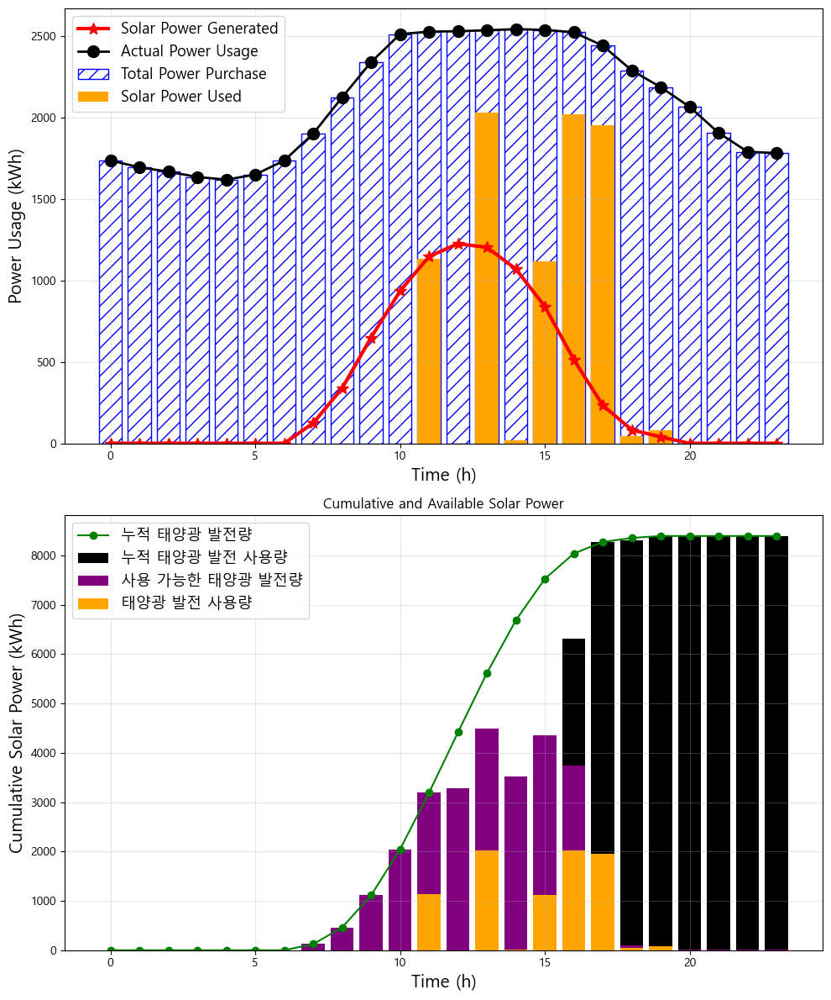

In [169]:
import matplotlib.pyplot as plt
import numpy as np

count = 800
hours = np.arange(24)
total_power = qq  
solar_power = ee  
purchase_power = total_power - solar_power
cumulative_solar_power = np.cumsum(solar_power).values  
available_solar_power = cumulative_solar_power - np.cumsum(his_df.Position[count])

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 12))  # 3 rows, 1 column

ax1.bar(hours, total_power, edgecolor='blue', hatch='//', color='white', label='Total Power Purchase')
ax1.bar(hours, his_df.Position[count], color='orange', label='Solar Power Used')
ax1.plot(solar_power, linewidth=3, color='red', marker='*', markersize=10, label='Solar Power Generated')
ax1.plot(total_power, linewidth=2, color='black', marker='o', markersize=10, label='Actual Power Usage')
ax1.legend(fontsize=13)
ax1.set_xlabel('Time (h)', fontsize=15)
ax1.set_ylabel('Power Usage (kWh)', fontsize=15)
ax1.grid(alpha=0.3)


ax2.plot(hours, np.cumsum(ee), color='green', marker='o', label='누적 태양광 발전량')
ax2.bar(hours, np.cumsum(his_df.Position[count]), color='k', label='누적 태양광 발전 사용량')
ax2.bar(hours, his_df.Position[count] + available_solar_power, color='purple', label='사용 가능한 태양광 발전량')
ax2.bar(hours, his_df.Position[count], color='orange', label='태양광 발전 사용량')


ax2.set_xlabel('Time (h)', fontsize=15)
ax2.set_ylabel('Cumulative Solar Power (kWh)', fontsize=15)
ax2.legend(fontsize=13)
ax2.grid(alpha=0.3)
ax2.set_title('Cumulative and Available Solar Power')

plt.tight_layout()
plt.show()


In [170]:
np.cumsum(his_df.Position[count])

array([   0.        ,    0.        ,    0.        ,    0.        ,
          0.        ,    0.        ,    0.        ,    0.        ,
          0.        ,    0.        ,    0.        , 1132.09571377,
       1132.09571377, 3159.09484298, 3178.0859888 , 4295.41246779,
       6312.64642954, 8263.9589698 , 8309.78758628, 8390.99660257,
       8390.99660257, 8390.99660257, 8390.99660257, 8390.99660257])

In [171]:
np.cumsum(np.diff(his_df.Position[800]))

array([0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 1.13209571e+03, 0.00000000e+00,
       2.02699913e+03, 1.89911458e+01, 1.11732648e+03, 2.01723396e+03,
       1.95131254e+03, 4.58286165e+01, 8.12090163e+01, 2.70006240e-13,
       2.70006240e-13, 2.70006240e-13, 2.70006240e-13])

In [172]:
np.array(his_df.Position[800]).cumsum() - np.array(his_df.Position[800])

array([   0.        ,    0.        ,    0.        ,    0.        ,
          0.        ,    0.        ,    0.        ,    0.        ,
          0.        ,    0.        ,    0.        ,    0.        ,
       1132.09571377, 1132.09571377, 3159.09484298, 3178.0859888 ,
       4295.41246779, 6312.64642954, 8263.9589698 , 8309.78758628,
       8390.99660257, 8390.99660257, 8390.99660257, 8390.99660257])

In [173]:
np.array(his_df.Position[800]).cumsum()

array([   0.        ,    0.        ,    0.        ,    0.        ,
          0.        ,    0.        ,    0.        ,    0.        ,
          0.        ,    0.        ,    0.        , 1132.09571377,
       1132.09571377, 3159.09484298, 3178.0859888 , 4295.41246779,
       6312.64642954, 8263.9589698 , 8309.78758628, 8390.99660257,
       8390.99660257, 8390.99660257, 8390.99660257, 8390.99660257])

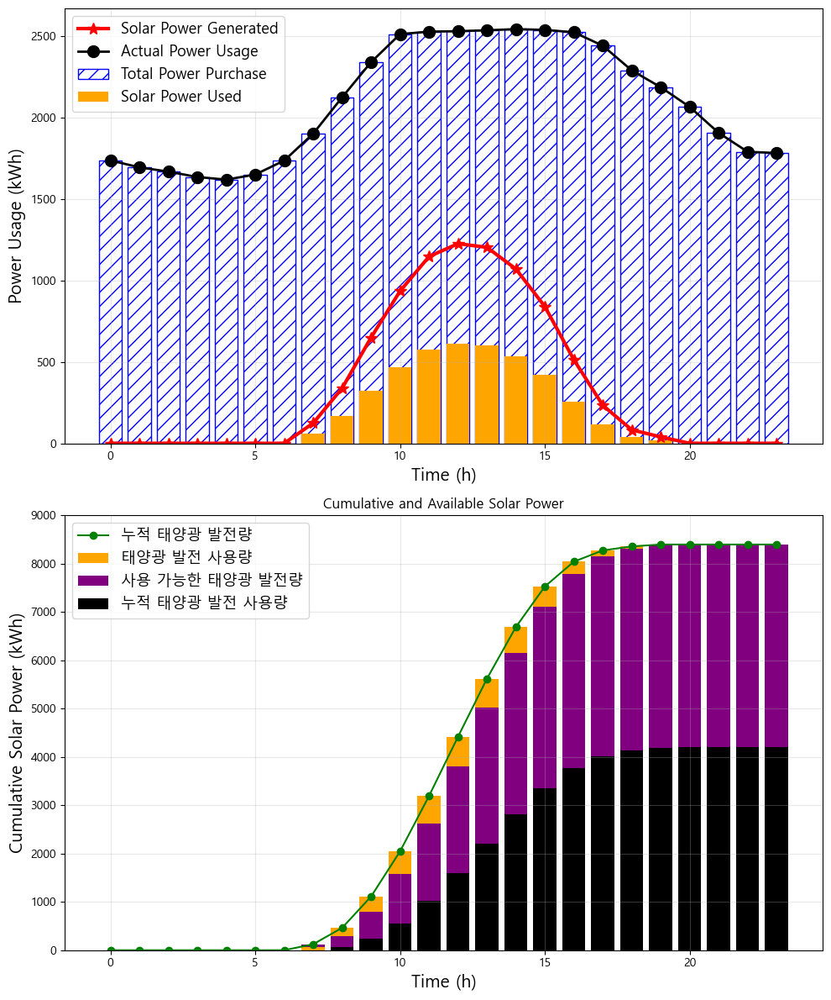

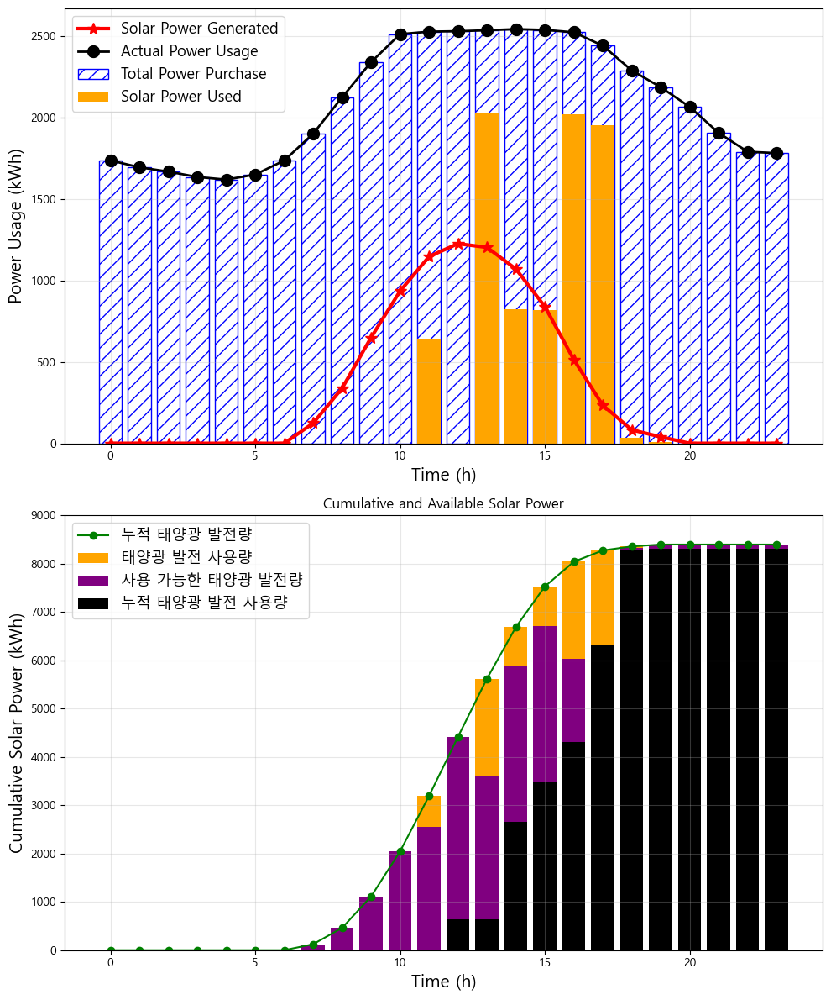

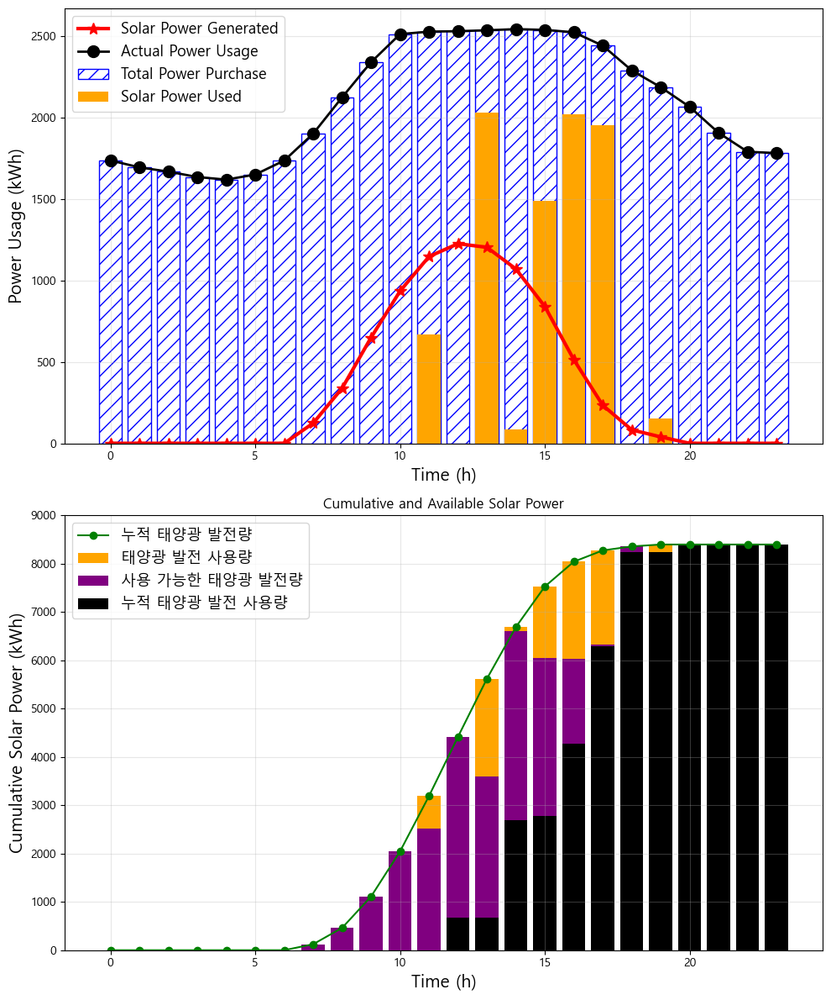

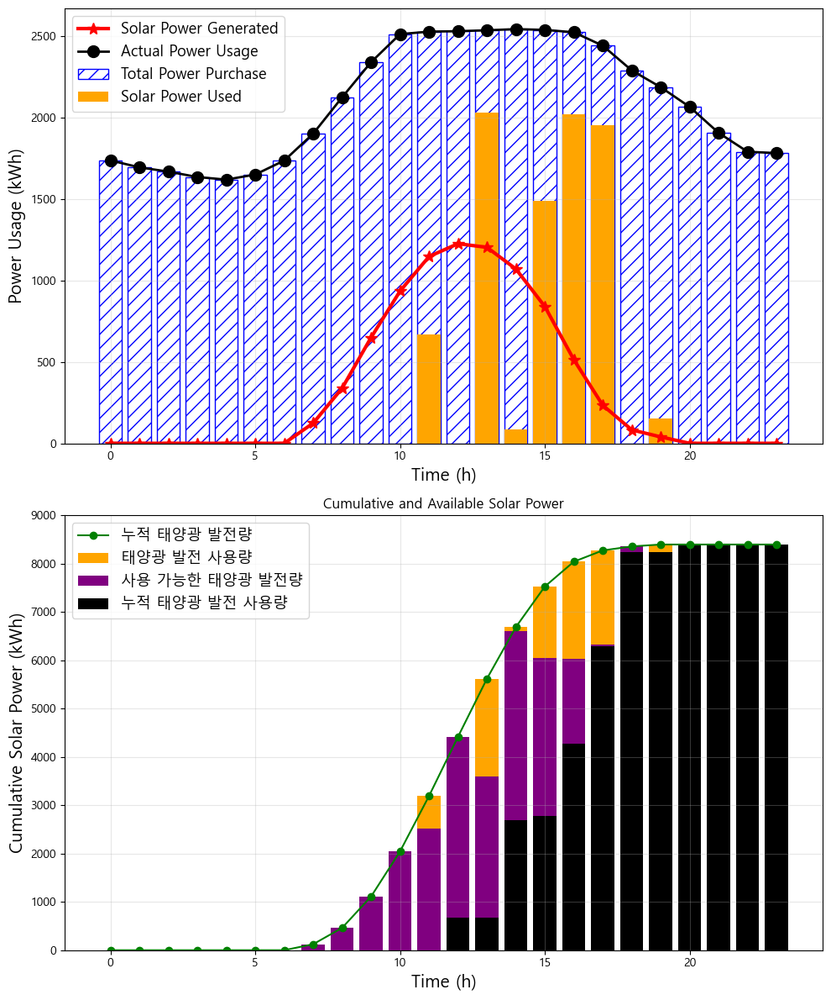

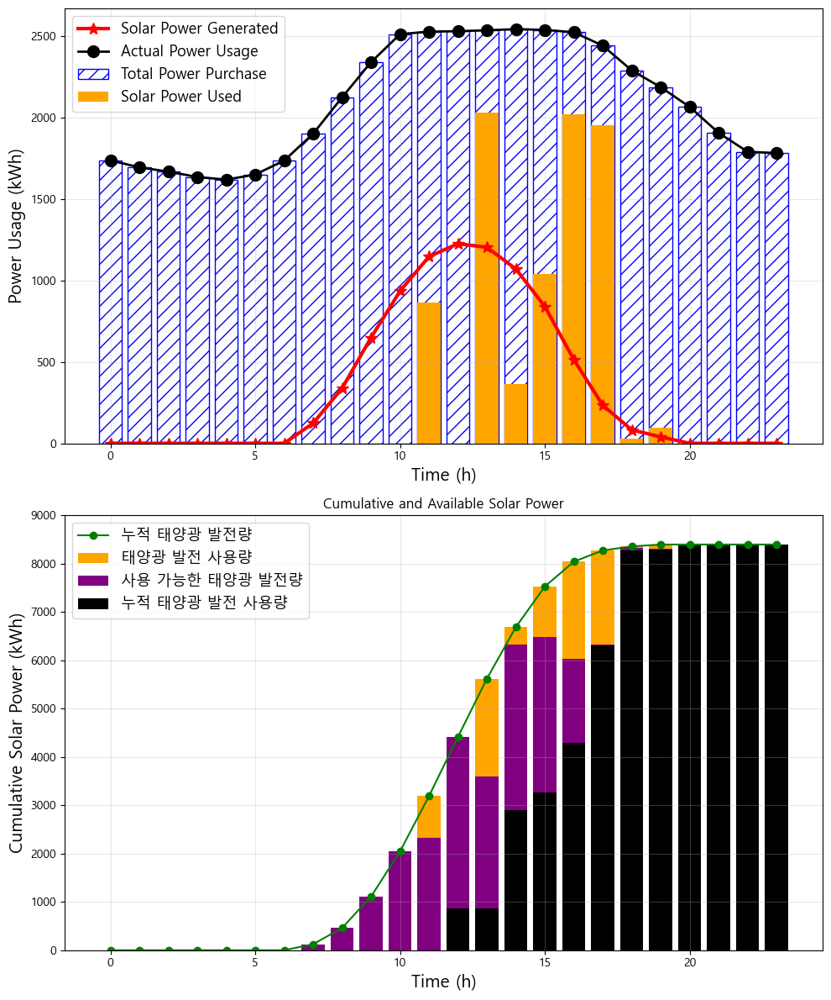

...

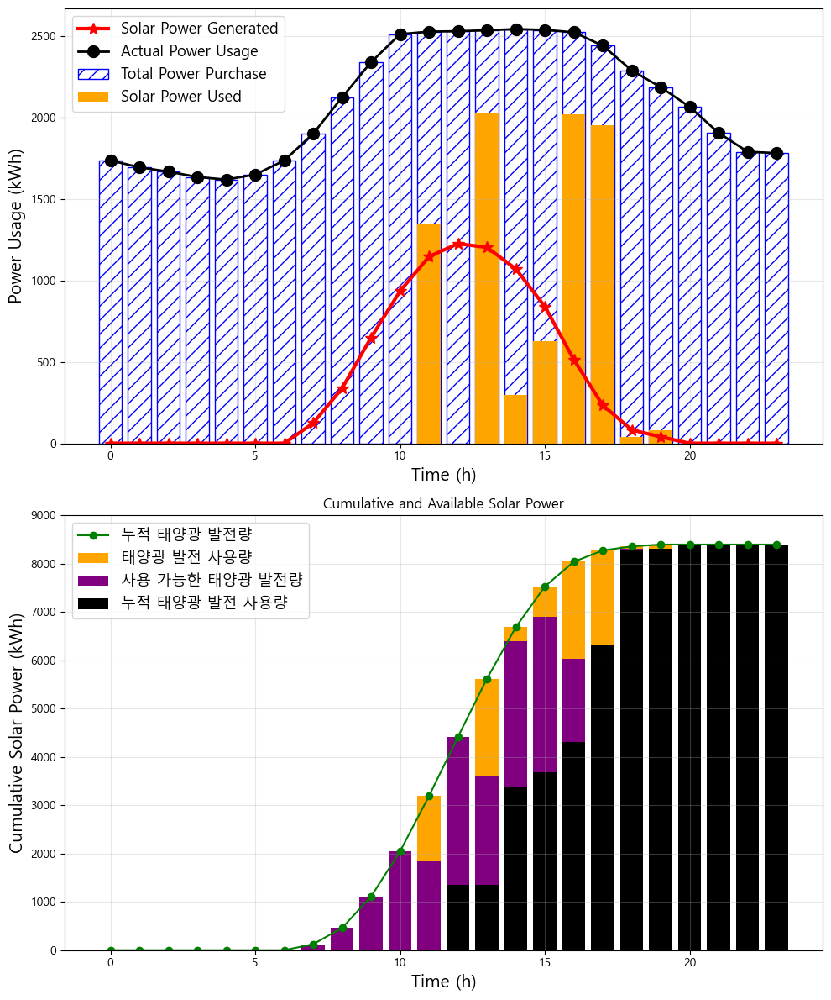

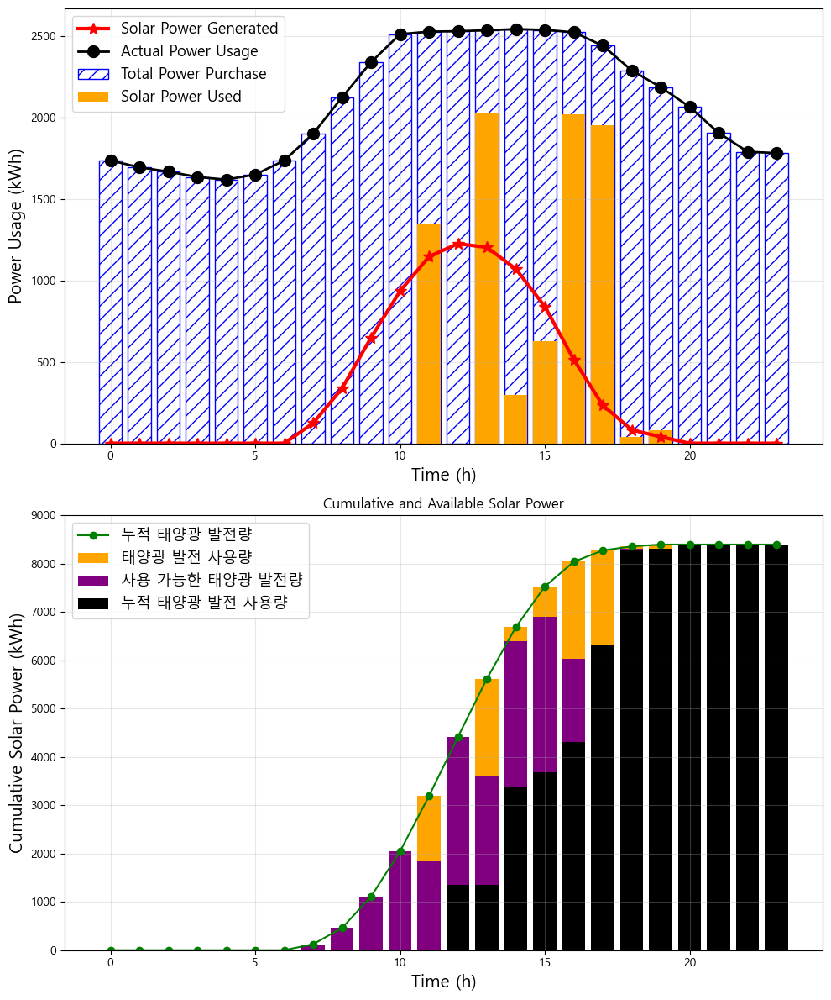

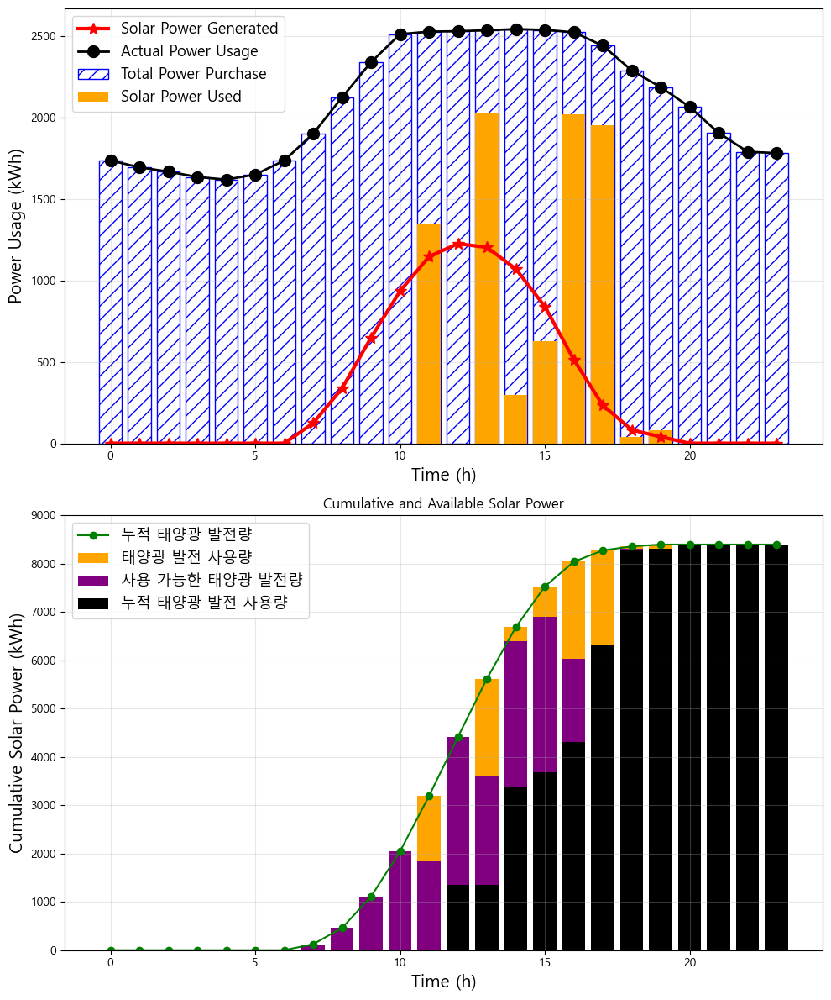

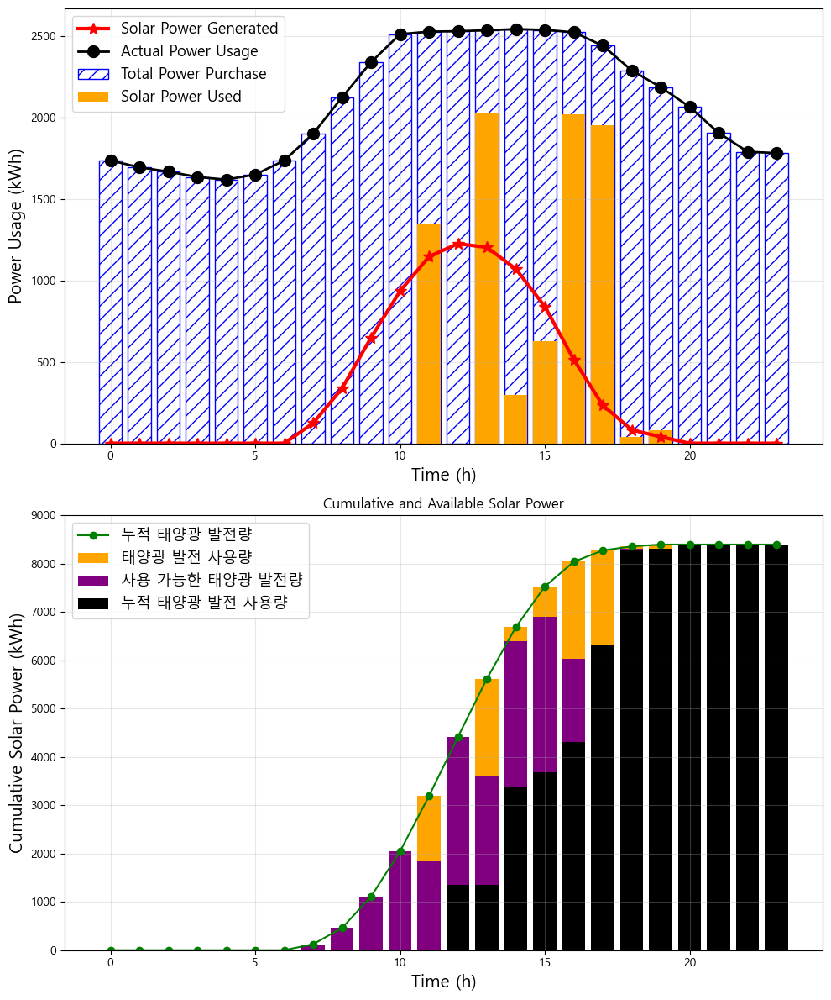

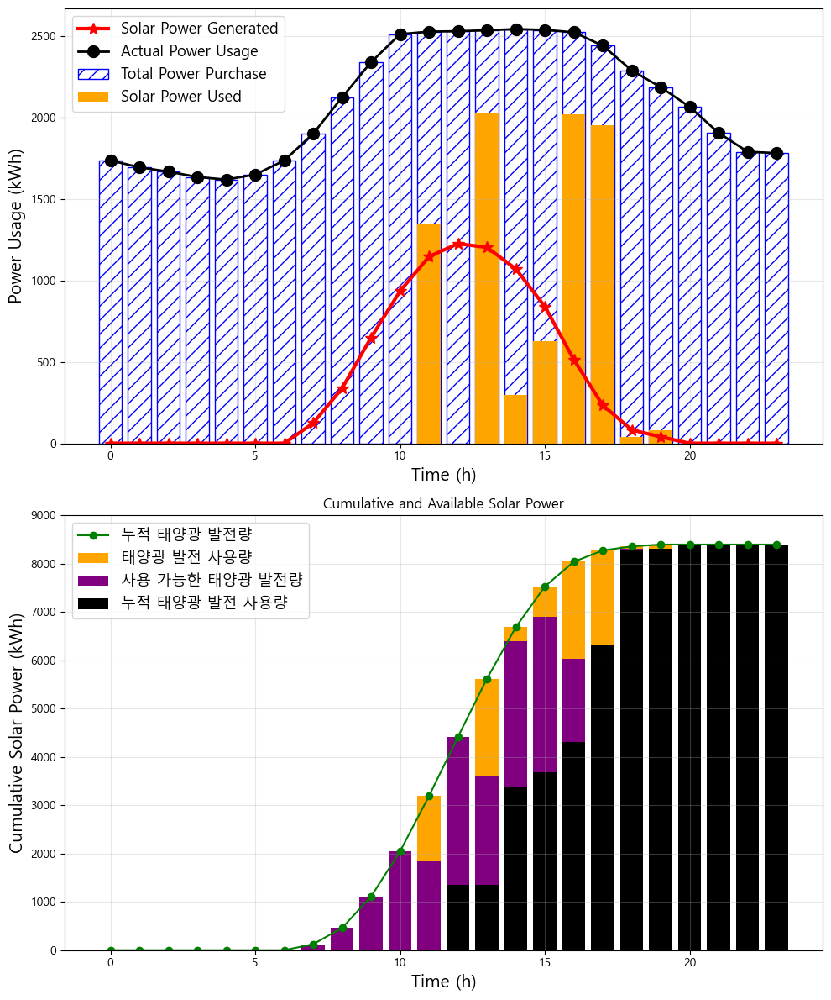

In [174]:
for i in range(0, len(his_df), 100):
    count = i
    hours = np.arange(24)
    total_power = qq
    solar_power = ee  
    purchase_power = total_power - solar_power
    cumulative_solar_power = np.cumsum(solar_power).values  
    available_solar_power = cumulative_solar_power - np.cumsum(his_df.Position[count])

    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 12))  # 3 rows, 1 column

    ax1.bar(hours, total_power, edgecolor='blue', hatch='//', color='white', label='Total Power Purchase')
    ax1.bar(hours, his_df.Position[count], color='orange', label='Solar Power Used')
    ax1.plot(solar_power, linewidth=3, color='red', marker='*', markersize=10, label='Solar Power Generated')
    ax1.plot(total_power, linewidth=2, color='black', marker='o', markersize=10, label='Actual Power Usage')
    ax1.legend(fontsize=13)
    ax1.set_xlabel('Time (h)', fontsize=15)
    ax1.set_ylabel('Power Usage (kWh)', fontsize=15)
    ax1.grid(alpha=0.3)


    ax2.plot(hours, np.cumsum(ee), color='green', marker='o', label='누적 태양광 발전량')

    label_solar_power_used = True
    label_available_solar_power = True
    label_cumulative_solar_power = True

    for hour, v1, v2, v3 in zip(hours, his_df.Position[count], np.cumsum(ee) - his_df.Position[count], np.array(his_df.Position[count]).cumsum() - np.array(his_df.Position[count])):
        if v1 >= v2:
            ax2.bar(hour, v1, color='orange', label='태양광 발전 사용량' if label_solar_power_used else None)
            ax2.bar(hour, v2, bottom=v1, color='purple', label='사용 가능한 태양광 발전량' if label_available_solar_power else None)
            label_solar_power_used = False
            label_available_solar_power = False
        else:
            ax2.bar(hour, v2, color='purple', label='사용 가능한 태양광 발전량' if label_available_solar_power else None)
            ax2.bar(hour, v1, bottom=v2, color='orange', label='태양광 발전 사용량' if label_solar_power_used else None)
            label_solar_power_used = False
            label_available_solar_power = False
        ax2.bar(hour, v3, color='k', label='누적 태양광 발전 사용량' if label_cumulative_solar_power else None)
        label_cumulative_solar_power = False

    ax2.set_xlabel('Time (h)', fontsize=15)
    ax2.set_ylabel('Cumulative Solar Power (kWh)', fontsize=15)
    ax2.set_ylim(0, 9000)
    ax2.legend(fontsize=13)
    ax2.grid(alpha=0.3)
    ax2.set_title('Cumulative and Available Solar Power')

    plt.tight_layout()
    plt.show()
